## Get feature by using Tsfresh
##### It will taks some time to run and the features will be saved under folder features as csv file

In [2]:
import pandas as pd

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
pd.set_option("max_colwidth", 100)

import os
from glob import glob

import matplotlib.pyplot as plt
import numpy as np

import seaborn as sns
from sklearn import preprocessing

from tsfresh import extract_features, extract_relevant_features, select_features
from tsfresh.feature_extraction import ComprehensiveFCParameters
from tsfresh.utilities.dataframe_functions import impute

/opt/anaconda3/envs/ti/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
/opt/anaconda3/envs/ti/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


## Load 2 data sets

### Load dataset :`Versuchreihe_09_2020`

In [3]:
data_path = "data/Versuchreihe_09_2020/machine_data/"
labels = pd.read_excel("data/Versuchreihe_09_2020/Label.xlsx")
labels = labels.rename(columns={"Unnamed: 0": "id"})


samples_path = glob("data/Versuchreihe_09_2020/machine_data/*.csv")
samples_id_path_dic = {x.split("/")[-1].split(".")[0]: x for x in samples_path}

meta_pd = pd.DataFrame(columns=["id", "label", "path"])
meta_pd["id"] = samples_id_path_dic.keys()
meta_pd["path"] = meta_pd["id"].map(samples_id_path_dic.get)

# from OK and NOK to 1 and  respectively
for i in meta_pd.iterrows():
    if labels[labels["id"] == i[1]["id"]]["LINE"].values == ["OK"]:
        i[1]["label"] = 1
    else:
        i[1]["label"] = 0
    # print(labels[ labels["id"]==i[1]['id'] ]['LINE'].values)

meta_pd_01 = meta_pd 

# meta_pd
# display(meta_pd.head(10))

# sample1 = meta_pd[  meta_pd['id']== "WPNR_1_xPos_6_yPos_0_EC_24"]["path"].to_list()[0]
# sample1 = pd.read_csv(sample1)
# sample1 .head()

# import pprint
# pprint.pprint(sample1.columns)
meta_pd_01.head()

,id,label,path
0,WPNR_7_xPos_4_yPos_5_EC_00,1,data/Versuchreihe_09_2020/machine_data/WPNR_7_xPos_4_yPos_5_EC_00.csv
1,WPNR_8_xPos_3_yPos_3_EC_00,1,data/Versuchreihe_09_2020/machine_data/WPNR_8_xPos_3_yPos_3_EC_00.csv
2,WPNR_1_xPos_1_yPos_0_EC_24,1,data/Versuchreihe_09_2020/machine_data/WPNR_1_xPos_1_yPos_0_EC_24.csv
3,WPNR_5_xPos_1_yPos_2_EC_00,1,data/Versuchreihe_09_2020/machine_data/WPNR_5_xPos_1_yPos_2_EC_00.csv
4,WPNR_6_xPos_5_yPos_3_EC_45,1,data/Versuchreihe_09_2020/machine_data/WPNR_6_xPos_5_yPos_3_EC_45.csv


### Load dataset :`Versuchsreihe_01_2022`

In [4]:
data_path = "data/Versuchsreihe_01_2022/machine_data/"



samples_path = glob("data/Versuchsreihe_01_2022/machine_data/*.csv")
samples_id_path_dic = {x.split("/")[-1].split(".")[0]: x for x in samples_path}

meta_pd_02 = None


meta_pd = pd.DataFrame(columns=["id", "label", "path"])


meta_pd_02 = pd.DataFrame(columns=["id", "label", "path"])
meta_pd_02["id"] = samples_id_path_dic.keys()
meta_pd_02['label'] = 1
meta_pd_02["path"] = meta_pd_02["id"].map(samples_id_path_dic.get)

meta_pd_02.head()

,id,label,path
0,MTD_TYP10004_571_ZTUT02xPos3yPos4WPNR007,1,data/Versuchsreihe_01_2022/machine_data/MTD_TYP10004_571_ZTUT02xPos3yPos4WPNR007.csv
1,MTD_TYP10004_500_ZTUT02xPos2yPos1WPNR004,1,data/Versuchsreihe_01_2022/machine_data/MTD_TYP10004_500_ZTUT02xPos2yPos1WPNR004.csv
2,MTD_TYP10004_509_ZTUT02xPos4yPos2WPNR004,1,data/Versuchsreihe_01_2022/machine_data/MTD_TYP10004_509_ZTUT02xPos4yPos2WPNR004.csv
3,MTD_TYP10004_446_ZTUT02xPos4yPos0WPNR003,1,data/Versuchsreihe_01_2022/machine_data/MTD_TYP10004_446_ZTUT02xPos4yPos0WPNR003.csv
4,MTD_TYP10004_534_ZTUT02xPos1yPos6WPNR004,1,data/Versuchsreihe_01_2022/machine_data/MTD_TYP10004_534_ZTUT02xPos1yPos6WPNR004.csv


In [5]:
def tsfresh_data_prepare(meta):
    """
    Reformlate the data set for tsfresh.

    return:
        X_df_container, y_df_container : pd.DataFrame, 

    """
    X_df_container = pd.DataFrame()
    y_df_container = pd.DataFrame()
    
    for id, path, label in zip(meta["id"], meta["path"], meta["label"]):

        sample = pd.read_csv(path)
        sample = sample.rename(columns={"Unnamed: 0": "time"})
        sample["id"] = id
        X_df_container = pd.concat([X_df_container, sample])

        y = pd.DataFrame( {"id":[id], "label":[label]})
        y_df_container = pd.concat([y_df_container,  y ])

    return X_df_container, y_df_container


tsf_pd_01, y_tsf_01 = tsfresh_data_prepare(meta_pd_01)
tsf_pd_02, y_tsf_02 = tsfresh_data_prepare(meta_pd_02)

In [6]:
# tsf_pd_01.head()
y_tsf_01.head()

,id,label
0,WPNR_7_xPos_4_yPos_5_EC_00,1
0,WPNR_8_xPos_3_yPos_3_EC_00,1
0,WPNR_1_xPos_1_yPos_0_EC_24,1
0,WPNR_5_xPos_1_yPos_2_EC_00,1
0,WPNR_6_xPos_5_yPos_3_EC_45,1


In [8]:
extraction_settings = ComprehensiveFCParameters()
from tsfresh.feature_extraction import MinimalFCParameters, extract_features


X_tsf_01 = extract_features(
    tsf_pd_01,
    column_id="id",
    column_sort="time",
    default_fc_parameters=extraction_settings,
    # we impute = remove all NaN features automatically
    impute_function=impute,
)



Feature Extraction: 100%|██████████| 60/60 [51:16<00:00, 51.28s/it]   


In [33]:
# a preprocess for second data set to avoid the problem of np.isnan()
tsf_pd_02.columns
f_list = ['CMD_SPEED|X', 'CMD_SPEED|Y', 'CMD_SPEED|Z', 'CMD_SPEED|SP',
       'CTRL_DIFF|X', 'CTRL_DIFF|Y', 'CTRL_DIFF|Z', 'CURRENT|X', 'CURRENT|Y',
       'CURRENT|Z', 'CURRENT|SP', 'linENC_POS|X', 'linENC_POS|Y',
       'linENC_POS|Z', 'ENC_POS|SP', 'POWER|X', 'POWER|Y', 'POWER|Z',
       'POWER|SP', 'TORQUE|X', 'TORQUE|Y', 'TORQUE|Z', 'TORQUE|SP']

for f in f_list:
    try:
        tsf_pd_02[f] = tsf_pd_02[f].map(float)
        np.isnan(tsf_pd_02[f])
    except TypeError:
        print(f)


tsf_pd_02.head()

,time,CMD_SPEED|X,CMD_SPEED|Y,CMD_SPEED|Z,CMD_SPEED|SP,CTRL_DIFF|X,CTRL_DIFF|Y,CTRL_DIFF|Z,CURRENT|X,CURRENT|Y,CURRENT|Z,CURRENT|SP,linENC_POS|X,linENC_POS|Y,linENC_POS|Z,ENC_POS|SP,POWER|X,POWER|Y,POWER|Z,POWER|SP,TORQUE|X,TORQUE|Y,TORQUE|Z,TORQUE|SP,id
0,0,0.269800,8.779381,-0.008018,34377.46766,-0.000089,0.000354,-0.000112,0.526367,-0.263184,-3.448730,-3.256348,15.017686,-10.186482,-27.999913,1.813590e+06,0.0,1.225906,0.0,1610.679857,0.714099,-0.344172,-4.731785,-2.737427,MTD_TYP10004_571_ZTUT02xPos3yPos4WPNR007
1,1,0.244316,8.784222,-0.020776,34377.46766,-0.000087,0.000222,-0.000312,0.541748,-0.281982,-3.458984,-3.395996,15.018196,-10.171982,-27.999703,1.813659e+06,0.0,1.225906,0.0,1687.378898,0.751560,-0.421436,-4.729443,-2.719116,MTD_TYP10004_571_ZTUT02xPos3yPos4WPNR007
2,2,0.223650,8.795568,0.009610,34377.46766,-0.000006,-0.000028,-0.000028,0.553711,-0.283691,-3.445312,-3.116699,15.018586,-10.157370,-27.999963,1.813727e+06,0.0,1.225906,0.0,1553.155577,0.767949,-0.381633,-4.729443,-2.636719,MTD_TYP10004_571_ZTUT02xPos3yPos4WPNR007
3,3,0.193121,8.832326,0.036335,34377.46766,-0.000148,-0.000057,0.000193,0.562256,-0.261475,-3.460693,-3.104004,15.019156,-10.142980,-28.000143,1.813796e+06,0.0,1.225906,0.0,1533.980817,0.770291,-0.379292,-4.745833,-2.572632,MTD_TYP10004_571_ZTUT02xPos3yPos4WPNR007
4,4,0.163839,8.885137,0.017365,34377.46766,-0.000290,-0.000208,-0.000139,0.546875,-0.263184,-3.447021,-3.180176,15.019686,-10.128458,-27.999753,1.813865e+06,0.0,1.225906,0.0,1572.330337,0.739854,-0.362903,-4.727102,-2.700806,MTD_TYP10004_571_ZTUT02xPos3yPos4WPNR007


In [ ]:

X_tsf_02 = extract_features(
    tsf_pd_02,
    column_id="id",
    column_sort="time",
    default_fc_parameters=extraction_settings,
    # we impute = remove all NaN features automatically
    impute_function=impute,
)

In [7]:
# save the DataFrame file
X_tsf_02.to_csv("features/X_tsf_02.csv")
X_tsf_02 = None
X_tsf_02 = pd.read_csv("features/X_tsf_02.csv",index_col = 0)
X_tsf_02.head()

X_tsf_01.to_csv("features/X_tsf_01.csv")
X_tsf_01 = None
X_tsf_01 = pd.read_csv("features/X_tsf_01.csv",index_col = 0)
X_tsf_01.head()

,CURRENT|Z__variance_larger_than_standard_deviation,CURRENT|Z__has_duplicate_max,CURRENT|Z__has_duplicate_min,CURRENT|Z__has_duplicate,CURRENT|Z__sum_values,CURRENT|Z__abs_energy,CURRENT|Z__mean_abs_change,CURRENT|Z__mean_change,CURRENT|Z__mean_second_derivative_central,CURRENT|Z__median,CURRENT|Z__mean,CURRENT|Z__length,CURRENT|Z__standard_deviation,CURRENT|Z__variation_coefficient,CURRENT|Z__variance,CURRENT|Z__skewness,CURRENT|Z__kurtosis,CURRENT|Z__root_mean_square,CURRENT|Z__absolute_sum_of_changes,CURRENT|Z__longest_strike_below_mean,CURRENT|Z__longest_strike_above_mean,CURRENT|Z__count_above_mean,CURRENT|Z__count_below_mean,CURRENT|Z__last_location_of_maximum,CURRENT|Z__first_location_of_maximum,CURRENT|Z__last_location_of_minimum,CURRENT|Z__first_location_of_minimum,CURRENT|Z__percentage_of_reoccurring_values_to_all_values,CURRENT|Z__percentage_of_reoccurring_datapoints_to_all_datapoints,CURRENT|Z__sum_of_reoccurring_values,CURRENT|Z__sum_of_reoccurring_data_points,CURRENT|Z__ratio_value_number_to_time_series_length,CURRENT|Z__sample_entropy,CURRENT|Z__maximum,CURRENT|Z__minimum,CURRENT|Z__benford_correlation,CURRENT|Z__time_reversal_asymmetry_statistic__lag_1,CURRENT|Z__time_reversal_asymmetry_statistic__lag_2,CURRENT|Z__time_reversal_asymmetry_statistic__lag_3,CURRENT|Z__c3__lag_1,CURRENT|Z__c3__lag_2,CURRENT|Z__c3__lag_3,CURRENT|Z__cid_ce__normalize_True,CURRENT|Z__cid_ce__normalize_False,CURRENT|Z__symmetry_looking__r_0.0,CURRENT|Z__symmetry_looking__r_0.05,CURRENT|Z__symmetry_looking__r_0.1,CURRENT|Z__symmetry_looking__r_0.15000000000000002,CURRENT|Z__symmetry_looking__r_0.2,CURRENT|Z__symmetry_looking__r_0.25,CURRENT|Z__symmetry_looking__r_0.30000000000000004,CURRENT|Z__symmetry_looking__r_0.35000000000000003,CURRENT|Z__symmetry_looking__r_0.4,CURRENT|Z__symmetry_looking__r_0.45,CURRENT|Z__symmetry_looking__r_0.5,CURRENT|Z__symmetry_looking__r_0.55,CURRENT|Z__symmetry_looking__r_0.6000000000000001,CURRENT|Z__symmetry_looking__r_0.65,CURRENT|Z__symmetry_looking__r_0.7000000000000001,CURRENT|Z__symmetry_looking__r_0.75,CURRENT|Z__symmetry_looking__r_0.8,CURRENT|Z__symmetry_looking__r_0.8500000000000001,CURRENT|Z__symmetry_looking__r_0.9,CURRENT|Z__symmetry_looking__r_0.9500000000000001,CURRENT|Z__large_standard_deviation__r_0.05,CURRENT|Z__large_standard_deviation__r_0.1,CURRENT|Z__large_standard_deviation__r_0.15000000000000002,CURRENT|Z__large_standard_deviation__r_0.2,CURRENT|Z__large_standard_deviation__r_0.25,CURRENT|Z__large_standard_deviation__r_0.30000000000000004,CURRENT|Z__large_standard_deviation__r_0.35000000000000003,CURRENT|Z__large_standard_deviation__r_0.4,CURRENT|Z__large_standard_deviation__r_0.45,CURRENT|Z__large_standard_deviation__r_0.5,CURRENT|Z__large_standard_deviation__r_0.55,CURRENT|Z__large_standard_deviation__r_0.6000000000000001,CURRENT|Z__large_standard_deviation__r_0.65,CURRENT|Z__large_standard_deviation__r_0.7000000000000001,CURRENT|Z__large_standard_deviation__r_0.75,CURRENT|Z__large_standard_deviation__r_0.8,CURRENT|Z__large_standard_deviation__r_0.8500000000000001,CURRENT|Z__large_standard_deviation__r_0.9,CURRENT|Z__large_standard_deviation__r_0.9500000000000001,CURRENT|Z__quantile__q_0.1,CURRENT|Z__quantile__q_0.2,CURRENT|Z__quantile__q_0.3,CURRENT|Z__quantile__q_0.4,CURRENT|Z__quantile__q_0.6,CURRENT|Z__quantile__q_0.7,CURRENT|Z__quantile__q_0.8,CURRENT|Z__quantile__q_0.9,CURRENT|Z__autocorrelation__lag_0,CURRENT|Z__autocorrelation__lag_1,CURRENT|Z__autocorrelation__lag_2,CURRENT|Z__autocorrelation__lag_3,CURRENT|Z__autocorrelation__lag_4,CURRENT|Z__autocorrelation__lag_5,CURRENT|Z__autocorrelation__lag_6,CURRENT|Z__autocorrelation__lag_7,CURRENT|Z__autocorrelation__lag_8,CURRENT|Z__autocorrelation__lag_9,"CURRENT|Z__agg_autocorrelation__f_agg_""mean""__maxlag_40","CURRENT|Z__agg_autocorrelation__f_agg_""median""__maxlag_40","CURRENT|Z__agg_autocorrelation__f_agg_""var""__maxlag_40",CURRENT|Z__partial_autocorrelation__lag_0,CURRENT|Z__partial_autocorrelation__lag_1,CURRENT|Z__

In [12]:
X_tsf_01.columns

Index(['CURRENT|Z__variance_larger_than_standard_deviation',
       'CURRENT|Z__has_duplicate_max', 'CURRENT|Z__has_duplicate_min',
       'CURRENT|Z__has_duplicate', 'CURRENT|Z__sum_values',
       'CURRENT|Z__abs_energy', 'CURRENT|Z__mean_abs_change',
       'CURRENT|Z__mean_change', 'CURRENT|Z__mean_second_derivative_central',
       'CURRENT|Z__median',
       ...
       'CURRENT|Y__permutation_entropy__dimension_5__tau_1',
       'CURRENT|Y__permutation_entropy__dimension_6__tau_1',
       'CURRENT|Y__permutation_entropy__dimension_7__tau_1',
       'CURRENT|Y__query_similarity_count__query_None__threshold_0.0',
       'CURRENT|Y__matrix_profile__feature_"min"__threshold_0.98',
       'CURRENT|Y__matrix_profile__feature_"max"__threshold_0.98',
       'CURRENT|Y__matrix_profile__feature_"mean"__threshold_0.98',
       'CURRENT|Y__matrix_profile__feature_"median"__threshold_0.98',
       'CURRENT|Y__matrix_profile__feature_"25"__threshold_0.98',
       'CURRENT|Y__matrix_profile__fe

In [9]:
X_filtered_01 = select_features(X_tsf_01, y_tsf_01.set_index("id")["label"])

# data set02 doesn't have label.

In [10]:
X_filtered_01.head()
print(X_filtered_01.columns)

Index(['CTRL_DIFF|Y__fft_coefficient__attr_"angle"__coeff_58',
       'CTRL_DIFF|Y__fft_coefficient__attr_"imag"__coeff_58',
       'CTRL_DIFF|X__c3__lag_1',
       'CTRL_DIFF|Y__cwt_coefficients__coeff_14__w_5__widths_(2, 5, 10, 20)',
       'CURRENT|Y__fft_coefficient__attr_"real"__coeff_58',
       'CURRENT|Y__fft_coefficient__attr_"angle"__coeff_58',
       'TORQUE|X__fft_coefficient__attr_"imag"__coeff_58',
       'CMD_SPEED|Y__fft_coefficient__attr_"imag"__coeff_58',
       'POWER|Y__fft_coefficient__attr_"real"__coeff_58',
       'CTRL_DIFF|Y__cwt_coefficients__coeff_13__w_5__widths_(2, 5, 10, 20)',
       ...
       'POWER|SP__ar_coefficient__coeff_4__k_10',
       'linENC_POS|X__ratio_beyond_r_sigma__r_10',
       'linENC_POS|Y__fft_coefficient__attr_"angle"__coeff_67',
       'TORQUE|Z__change_quantiles__f_agg_"mean"__isabs_False__qh_0.8__ql_0.2',
       'CURRENT|Z__fft_coefficient__attr_"abs"__coeff_71',
       'TORQUE|Y__fft_coefficient__attr_"imag"__coeff_69',
       'TORQ

In [11]:
# PCA
from sklearn.decomposition import PCA

## run PCA on unfiltered features
# pca = PCA(n_components=2)
# pca_features=pca.fit_transform(X_tsf_01)
# print(pca.explained_variance_ratio_)


# ## run PCA on filtered features
pca = PCA(n_components=2)
pca_features=pca.fit_transform(X_filtered_01)
print(pca.explained_variance_ratio_)



[1.00000000e+00 4.14560311e-11]


(392, 2)


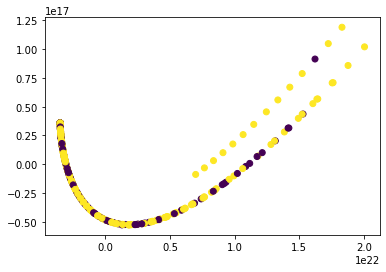

In [74]:
print(pca_features.shape)
# print(pca_features)

plt.scatter(*pca_features.T,c=meta_pd_01['label'])


In [14]:
#t-SNE
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2, learning_rate='auto',
                  init='random').fit_transform(X_tsf_01)

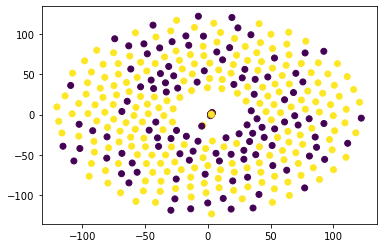

In [15]:
# X_embedded.shape

plt.scatter(*X_embedded.T,c=meta_pd_01['label'])